The following additional libraries are needed to run this
notebook. Note that running on Colab is experimental, please report a Github
issue if you have any problem.

In [ ]:
!pip install -U mxnet-cu101==1.7.0
!pip install d2l==0.17.0
!pip install pulp
!pip install jupyterthemes

In [ ]:
%matplotlib inline
import math
from mxnet import np, npx
from d2l import mxnet as d2l
import matplotlib.pyplot as plt
import numpy as np
import torch
import imageio
import os
from jupyterthemes import jtplot

from pulp import LpMaximize, LpProblem, LpStatus, lpSum, LpVariable
import math as mt
import pandas as pd
from sympy import *
import numpy as np
import collections
import matplotlib.pyplot as plt
import random
from jupyterthemes import jtplot

# currently installed theme will be used to
# set plot style if no arguments provided
jtplot.style()
jtplot.style(theme='onedork', figsize=(9, 6))
npx.set_np()

# Q1

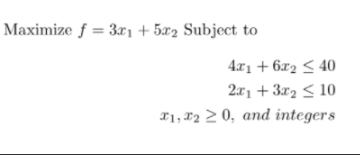

In [41]:
# create the model
model = LpProblem(name = "Q1", sense = LpMaximize)
# Initialize the decision variables
x1 = LpVariable("x1", lowBound = 0, cat = 'Integer')
x2 = LpVariable("x2", lowBound = 0, cat = 'Integer')
# Add the constraints to the model
model += (4 * x1 + 6*x2 <=40, 'first_constraint')
model += (2 * x1 +3*x2 <= 10, 'second_constraint')
# add objective function
model+= 3*x1 +5*x2

print(f"Our Defined Model {model}")

Our Defined Model Q1:
MAXIMIZE
3*x1 + 5*x2 + 0
SUBJECT TO
first_constraint: 4 x1 + 6 x2 <= 40

second_constraint: 2 x1 + 3 x2 <= 10

VARIABLES
0 <= x1 Integer
0 <= x2 Integer



In [42]:
if model.solve():
    print("Optimal Soution is found")
    print(f"Ojective function Value f{model.objective.value()}")
    for var in model.variables():
        print(f"{var.name}: {var.value()}")
    for name, constraint in model.constraints.items():
        print(f"{name}: {constraint.value()}")

Optimal Soution is found
Ojective function Value f16.0
x1: 2.0
x2: 2.0
first_constraint: -20.0
second_constraint: 0.0


# Q2
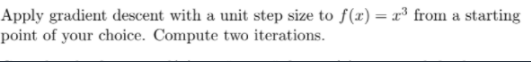

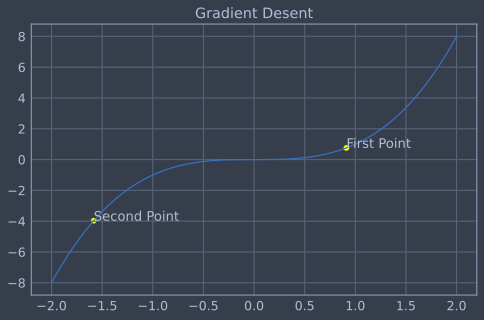

In [ ]:

def gradient_desent(func, iteration, stepsize):
    x= symbols('x') 
    funcc = func.copy()
    
    
    #print(points)
    random.seed(2)
    points = [random.uniform(-1, 1)]
    func_value = []
    for i in range(iteration):
        
        func_value.append(func.subs(x, points[-1]).doit())
        diff_func = Derivative(func, x).doit()
#         print("points",points)
#         print('fnction vale',func_value)
        #print(func)
        points.append(points[-1]- stepsize * diff_func.subs(x,points[-1]))
    #print(numbers)
    fig, ax = plt.subplots(figsize=(8,5))
    plt.scatter(points[0:-1], func_value, color = 'yellow')
    temp = np.linspace(-2,2, 100)
    line = plt.plot(temp, temp**3 )
    
    ax.annotate('First Point', xy =(points[0:-1][0], func_value[0]),)
    ax.annotate('Second Point', xy =(points[0:-1][1], func_value[1]),)
    ax.set_title('Gradient Desent')
    plt.show()
x= symbols('x') 
gradient_desent( sympify(x**3) , 2, 1)

# Q3
Consider the function f(x) = e^x + e^−x
from x(1) = 10 with both a unit
step size and with exact line search. Apply gradient desecent, RMSProp,
Adagrad, and Adam techniques.

## RMSProp


In [ ]:
temp = np.linspace(-10,10,10000)

def rmsprop_2d(x1, s1):
    g1,  eps = np.exp(x1)-np.exp(-x1), 1e-6
    function_value = [f_2d(x1)]
    points = [x1]
    plots = []
    i = 0
    if not os.path.isdir("rmsprop"): 
      os.mkdir('rmsprop')
    while function_value[-1] >= 2.5:
      plt.plot(x1,function_value[-1], 'o', color = 'orange', label= 'Optimizer vale')
      plt.plot(temp, f_2d(temp), label = 'Function: e^x+e^-x')
      plt.xlabel('Value of X')
      plt.ylabel('Function Value')
      plt.legend(loc="upper center")
      plt.title('Trace Of Rmsprop Optimizer')
      plt.savefig(f"rmsprop/{i}.png")
      plots.append(f"rmsprop/{i}.png")

      s1 = gamma * s1 + (1 - gamma) * g1 ** 2
      x1 -= eta / math.sqrt(s1 + eps) * g1
      points.append(x1)
      function_value.append(f_2d(x1))

      i+=1
      plt.close()
    return points, function_value, plots

def f_2d(x):
    return np.exp(x)+np.exp(-x)
eta, gamma = 1, 0.9
x,y, plotsname = rmsprop_2d(10, 1)
# plt.plot(x,y, 'o', color = 'orange')
#print(x)
# plt.plot(temp, f_2d(temp))
# plt.close()

# build gif
with imageio.get_writer('rmsprop/rmsprop.gif', mode='I', fps = 10) as writer:
    for filename in plotsname:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# Remove files
for filename in set(plotsname):
    os.remove(filename)

print("Saved rmsprop/ramprop.gif ")

Saved rmsprop/ramprop.gif 


### Result
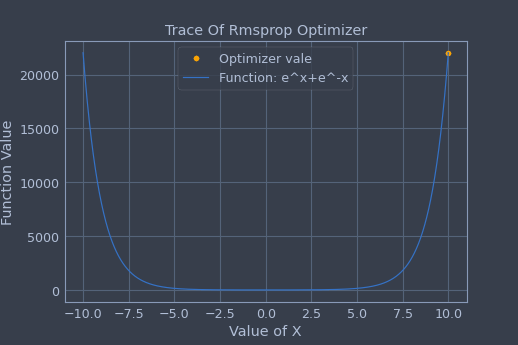

## Adagrad


In [ ]:
def adagrad(x1, s1):
    g1,  eps = np.exp(x1)-np.exp(-x1), 1e-6
    function_value = [f_2d(x1)]
    points = [x1]
    plots = []
    i = 0

    if not os.path.isdir("adagrad"): 
      os.mkdir('adagrad')
    while function_value[-1] >= 3:
      plt.plot(x1,function_value[-1], 'o', color = 'orange', label= 'Optimizer vale')
      plt.plot(temp, f_2d(temp), label = 'Function: e^x+e^-x')
      plt.xlabel('Value of X')
      plt.ylabel('Function Value')
      plt.legend(loc="upper center")
      plt.title('Trace Of Adagrad Optimizer')
      plt.savefig(f"adagrad/{i}.png")
      plots.append(f"adagrad/{i}.png")
      s1 += g1 ** 2
      x1 -= eta / math.sqrt(s1 + eps) * g1
      points.append(x1)
      function_value.append(f_2d(x1))

      i+=1
      plt.close()
    return points, function_value, plots

x,y, plotsname = adagrad(10, 1)
# plt.plot(x,y, 'o', color = 'orange')
#print(x)
# plt.plot(temp, f_2d(temp))
# plt.close()

# build gif
with imageio.get_writer('adagrad/adagrad.gif', mode='I', fps = 10) as writer:
    for filename in plotsname:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# Remove files
for filename in set(plotsname):
    os.remove(filename)
print("Saved adagrad/adagrad.gif")

Saved adagrad/adagrad.gif


### Result
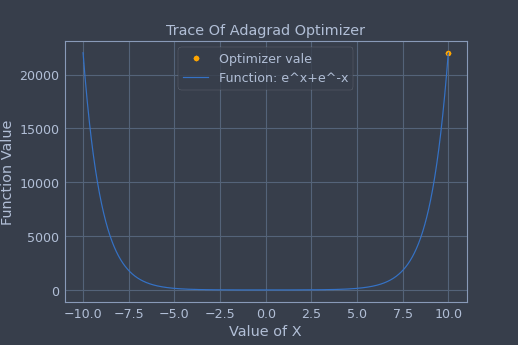

## Gradient Desecent

In [43]:
def f_grad(x1):
  return np.exp(x1)-np.exp(-x1)

def gradient_descent(x1, eta):
  function_value = [f_2d(x1)]
  points = [x1]
  plots = []
  i = 0
  if not os.path.isdir("gradient_descent"):
    os.mkdir('gradient_descent')
  while function_value[-1] >= 50:
      plt.plot(x1,function_value[-1], 'o', color = 'orange', label= 'Optimizer vale')
      plt.plot(temp, f_2d(temp), label = 'Function: e^x+e^-x')
      plt.xlabel('Value of X')
      plt.ylabel('Function Value')
      plt.legend(loc="upper center")
      plt.title('Trace Of Gradent Descent Optimizer')
      
      plt.savefig(f"gradient_descent/{i}.png")
      plots.append(f"gradient_descent/{i}.png")

      g1 =  np.exp(x1)-np.exp(-x1)
      g1 += np.random.normal(0.0, 1, (1,))
      eta_t = eta * 1
      x1 -= eta_t * g1
      #print(f'x = {x1}')

      points.append(x1)
      function_value.append(f_2d(x1))

      i+=1
      plt.close()
  return points, function_value, plots

x,y, plotsname = gradient_descent(10, 0.0001)
# plt.plot(x,y, 'o', color = 'orange')
#print(x)
# plt.plot(temp, f_2d(temp))
# plt.close()

# build gif
with imageio.get_writer('gradient_descent/gradient_descent.gif', mode='I', fps = 10) as writer:
    for filename in plotsname:
        image = imageio.imread(filename)
        writer.append_data(image)
        
# Remove files
for filename in set(plotsname):
    os.remove(filename)
print("Saved gradient_descent/gradient_descent.gif")

Saved gradient_descent/gradient_descent.gif


### Result
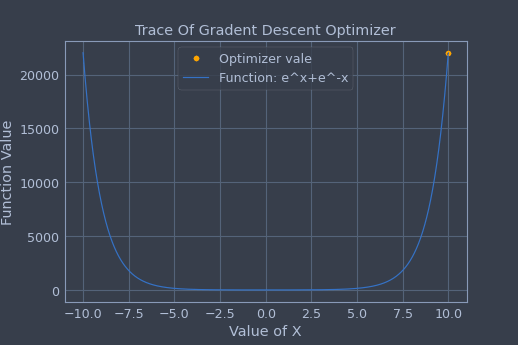